In [1]:
'''Comienza Bloque de Geopandas'''

'Comienza Bloque de Geopandas'

In [2]:
import pandas as pd
import numpy as np
import datetime
from os import listdir
from pylab import plt
plt.style.use('seaborn')
import matplotlib as mpl
mpl.rcParams['font.family'] = 'serif'
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('display.max_colwidth', -1)

C:\Users\Alfredo\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  if sys.path[0] == '':


In [3]:
'''cargo el csv de la etapa anterior y dropeo la columna unnamed ID'''
df_a_clean = pd.read_csv("df_a_clean.csv", encoding='utf-8')
df_a_clean.drop(df_a_clean.columns[[0]],axis=1,inplace=True)

In [4]:
'''creo una funcion de calculo para los nan de precio x m2'''
def calculateM2(x):
    if np.isnan(x["price_usd_per_m2"]):
        return (x["price"]/x["surface_total_in_m2"])
    else:
        return x["price_usd_per_m2"]


In [5]:
'''construyo el valor de precio x m2 a partir del precio y metros totales'''
df_a_clean["price_usd_per_m2_b"] = df_a_clean.apply(calculateM2,axis=1)
df_a_clean.drop(["price_usd_per_m2"],axis=1,inplace=True)
df_a_clean.rename(columns={"price_usd_per_m2_b":"price_usd_per_m2"},inplace=True)
df_a_clean

,ID,property_type,place_name,country_name,state_name,lat-lon,lat,lon,currency,price_aprox_local_currency,...,surface_covered_in_m2,price_per_m2,floor,expenses,description,title,rooms,price,surface_total_in_m2,price_usd_per_m2
0,2,apartment,Mataderos,Argentina,Capital Federal,"-34.6522615,-58.5229825",-34.652262,-58.522982,USD,1270404.00,...,55.0,1309.090909,NaN,NaN,"2 ambientes 3er piso lateral living comedor amplio cocina separada con lavadero, baño completo y dormitorio con placard. bajas expensas, excelente ubicacion aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).",2 amb 3er piso con ascensor apto credito,2.0,72000.0,55.0,1309.090909
1,7,apartment,Belgrano,Argentina,Capital Federal,"-34.5598729,-58.443362",-34.559873,-58.443362,USD,2434941.00,...,40.0,3450.000000,NaN,NaN,"excelente monoambiente a estrenar amplio super luminoso ...piso alto cocina americana. baño completo pileta ,solarium, laundry apto profesionalproximo av del libertador muy buena zona !!!! aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).","jose hernandez 1400 monoambiente estrenar categoria , venta",1.0,138000.0,45.0,3066.666667
2,8,apartment,Belgrano,Argentina,Capital Federal,"-34.5598729,-58.443362",-34.559873,-58.443362,USD,3440677.50,...,60.0,3250.000000,NaN,NaN,"excelente dos ambientes estrenar amplio super luminoso ...piso alto cocina americana. baño completo pileta ,solarium, laundry apto profesionalproximo av del libertador muy buena zona !!!! aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).","jose hernandez 1400 dos ambientes estrenar , categoria , venta",2.0,195000.0,65.0,3000.000000
3,13,apartment,Palermo Soho,Argentina,Capital Federal,NaN,NaN,NaN,USD,1970890.65,...,30.0,3723.333333,NaN,NaN,"torre i mondrian. 3 ambientes con terraza y dos baños al frente.vitraux ofrece en el ultimo nivel, piscina con solarium, un espacio con sala de reunión para uso profesional, eventos o proyecciones con un amplio foyer, sauna, gimnasio, un salón de usos múltiples con cocina y una amplia expansión. asimismo cuenta con un hall en doble altura y un amplio estar que balconea al mismo en el primer piso.así destaca la excelente relación de espacios de uso común sobre el metro propio, sobre todo en studios que rondan los 30 metros propios y pueden gozar de todos los diferentes usos especiales.",vitraux palermo,3.0,111700.0,50.0,2234.000000
4,14,apartment,Palermo Soho,Argentina,Capital Federal,NaN,NaN,NaN,USD,2609621.55,...,31.0,4770.967742,NaN,NaN,"torre ii dalí. ambiente unico divisible.vitraux ofrece en el ultimo nivel, piscina con solarium, un espacio con sala de reunión para uso profesional, eventos o proyecciones con un amplio foyer, sauna, gimnasio, un salón de usos múltiples con cocina y una amplia expansión. asimismo cuenta con un hall en doble altura y un amplio estar que balconea al mismo en el primer piso.así destaca la excelente relación de espacios de uso común sobre el metro propio, sobre todo en studios que rondan los 30 metros propios y pueden gozar de todos los diferentes usos especiales.",vitraux palermo,1.0,147900.0,42.0,3521.428571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23759,121160,apartment,Belgrano,Argentina,Capital Federal,"-34.563685346,-58.4426825896",-34.563685,-58.442683,USD,7234245.00,...,NaN,NaN,NaN,6300.0,"edificio en esquina de muy buena categoría de unos 45 años de antigüedad. pisos de altura 14, unidades por piso 1, ascensor principal 1, ascensor de servicio 1. vigilancia 24hs.funcionalidad: palier privado, hall de recepción, living y comedor amplios con salida a balcón al frente, hall íntimo con placards, dormitorio principal al frente con placards, 2º dormitorio al frente con placards, 3º dormitorio con placards y salida a balcón corrido al frente (sobre zabala), baño completo de época, baño con ducha de época, playroon/escritorio, cocina completa de época con office y entrada

In [6]:
'''me fijo si los valores de price son consistentes con metros totales y precio de m2, de no serlo'''
def checkPrices(x):
    est_price = (x["price_usd_per_m2"]*x["surface_total_in_m2"])
    est_error = est_price*0.01
    if ((x["price"] < (est_price + est_error)) & (x["price"] > (est_price - est_error))):
        return True
    else:
        return False

df_a_clean["price_consistent"] = df_a_clean.apply(checkPrices,axis=1)
df_a_clean[(df_a_clean["price_consistent"]==False)]

,ID,property_type,place_name,country_name,state_name,lat-lon,lat,lon,currency,price_aprox_local_currency,...,price_per_m2,floor,expenses,description,title,rooms,price,surface_total_in_m2,price_usd_per_m2,price_consistent


In [7]:
df_a_clean.isnull().sum()

ID                            0    
property_type                 0    
place_name                    0    
country_name                  0    
state_name                    0    
lat-lon                       5882 
lat                           5882 
lon                           5882 
currency                      0    
price_aprox_local_currency    0    
price_aprox_usd               0    
surface_covered_in_m2         884  
price_per_m2                  886  
floor                         20998
expenses                      17861
description                   0    
title                         0    
rooms                         2195 
price                         0    
surface_total_in_m2           0    
price_usd_per_m2              0    
price_consistent              0    
dtype: int64

In [8]:
'''Definicion de funcion de búsqueda del mejor dato encontrado por la regex de pozos'''
def selectPozo(x):
    if x[0] is not np.nan:
        return 1
    if x[1] is not np.nan:
        return 1
    else:
        return 0

In [9]:
'''Defino la regex y busco en el título. Luego reemplazo los grupos de captura por valores útiles'''
import re
pattern_pozo = '(pozo)|(emprendimiento)'
pozo_title = df_a_clean["title"].str.extract(pattern_pozo,flags=re.IGNORECASE,expand=False)
#pozo_title

In [10]:
'''obtengo una serie con el resultado de colapsar por el mejor resultado de la búsqueda Regex del título'''
pozo_title_collapse = pozo_title.apply(selectPozo,axis=1)
#pozo_title_collapse.head(30)

In [11]:
'''Busco la regex en la descripcion'''
pozo_descr = df_a_clean["description"].str.extract(pattern_pozo,flags=re.IGNORECASE,expand=False)
pozo_descr_collapse = pozo_descr.apply(selectPozo,axis=1)
#pozo_descr_collapse.head(20)

In [12]:
'''Defino un DF a partir de las series rooms del DF orifinal, resultado regex de descripcion y título'''
df_pozo_full = pd.DataFrame({'description':pozo_descr_collapse,
                             'title':pozo_title_collapse
                             })
#df_rooms_full

In [13]:
'''Defino la funcion para buscar el mejor valor entre los encontrados en original, título o descripcion
con orden de importancia título, descripción y de no encontrar, original'''

def guardarDescripcionPozo(x):
    if x['title']!=0:
        return x['title']
    if x['description']!=0:
        return x['description']
    return 0
    

In [14]:
'''Reemplazo la columna rooms por los datos minados'''
df_a_clean["pozo"] = df_pozo_full.apply(guardarDescripcionPozo,axis=1)
'''descarto los valores que son pozo o no tienen posicionamiento'''
df_a_clean.drop(df_a_clean[(df_a_clean["pozo"]==1) | (df_a_clean["lat-lon"].isnull())].index,inplace=True)

In [15]:
'''Descarto los elementos duplicados en titulo, descripcion y precio'''
df_a_clean.drop(df_a_clean[(df_a_clean["description"].duplicated()) & (df_a_clean["title"].duplicated() & df_a_clean["price"].duplicated())].index,inplace=True)

In [16]:
df_a_clean

,ID,property_type,place_name,country_name,state_name,lat-lon,lat,lon,currency,price_aprox_local_currency,...,floor,expenses,description,title,rooms,price,surface_total_in_m2,price_usd_per_m2,price_consistent,pozo
0,2,apartment,Mataderos,Argentina,Capital Federal,"-34.6522615,-58.5229825",-34.652262,-58.522982,USD,1270404.00,...,NaN,NaN,"2 ambientes 3er piso lateral living comedor amplio cocina separada con lavadero, baño completo y dormitorio con placard. bajas expensas, excelente ubicacion aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).",2 amb 3er piso con ascensor apto credito,2.0,72000.0,55.0,1309.090909,True,0
1,7,apartment,Belgrano,Argentina,Capital Federal,"-34.5598729,-58.443362",-34.559873,-58.443362,USD,2434941.00,...,NaN,NaN,"excelente monoambiente a estrenar amplio super luminoso ...piso alto cocina americana. baño completo pileta ,solarium, laundry apto profesionalproximo av del libertador muy buena zona !!!! aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).","jose hernandez 1400 monoambiente estrenar categoria , venta",1.0,138000.0,45.0,3066.666667,True,0
2,8,apartment,Belgrano,Argentina,Capital Federal,"-34.5598729,-58.443362",-34.559873,-58.443362,USD,3440677.50,...,NaN,NaN,"excelente dos ambientes estrenar amplio super luminoso ...piso alto cocina americana. baño completo pileta ,solarium, laundry apto profesionalproximo av del libertador muy buena zona !!!! aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).","jose hernandez 1400 dos ambientes estrenar , categoria , venta",2.0,195000.0,65.0,3000.000000,True,0
5,19,apartment,Palermo,Argentina,Capital Federal,"-34.580503566,-58.4058744847",-34.580504,-58.405874,USD,6175575.00,...,NaN,NaN,excelente semipiso al contra frente en bulnes y libertador. espectacular pulmón muy luminoso con árboles. buen edificio con entrada reciclada hace dos años. hall de entrada. living comedor de muy buenas dimensiones con salida al balcón aterrazado. toilette de recpeción. master suite muy grande con vestidor y gran baño (revestimientos de marmol) también al frente. segundo dormitorio o escritorio (chico) a aire luz muy luminoso. muy linda cocina con muebles alemanes. pisos de parquet. persianas eléctricas. aislación acústica en paredes. detalles de muy buena calidad. baulera común. la unidad originalmente era de dos dormitorios pero fue refaccionada al plano actual (master suite más dormitorio chico o escritorio). impecable!,"bulnes y libertador: espectacular pulmón, con balcón aterrazado reciclado a nuevo!",3.0,350000.0,104.0,3365.384615,True,0
6,21,apartment,Palermo,Argentina,Capital Federal,"-34.590926,-58.4116653",-34.590926,-58.411665,USD,4772837.25,...,NaN,NaN,"excelente zona, multiples medios de transporte - dos patios - muy buen estado - a cuadras de av.santa fe.",departamento de 4 ambientes en venta en palermo,4.0,270500.0,118.0,2292.372881,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23754,121151,apartment,Flores,Argentina,Capital Federal,"-34.6295045177,-58.460641832",-34.629505,-58.460642,USD,2117340.00,...,NaN,6500.0,"departamento al frente con balcón, dos dormitorios con placard, living comedor, baño completo. cocina, dependencia de serv. y baño de serv. a metros de av. rivadavia. pisos de parquet en todo el departamento. para mas informacion comunicarse al . gaed inmobiliaria.",departamento - flores,NaN,120000.0,72.0,1666.666667,True,0
23756,121153,apartment,Barrio Norte,Argentina,Capital Federal,"-34.5992135511,-58.4025191971",-34.599214,-58.402519,USD,2911342.50,...,NaN,NaN,"excelente departamento con terraza propia y parrilla.superficie cubierta: 65.19m2al ingresar nos encontramos con un amplio living comedor con pisos de parquet y salida a un estar muy luminoso, del mismo tenemos salida a una terraza muy amplia con parrilla.cocina con lavadero independiente, muebles bajo mesada y alacena.dos dormitorios con pi

In [17]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df_a_clean.describe()

,ID,lat,lon,price_aprox_local_currency,price_aprox_usd,surface_covered_in_m2,price_per_m2,floor,expenses,rooms,price,surface_total_in_m2,price_usd_per_m2,pozo
count,14775.000,14775.000,14775.000,14775.000,14775.000,14327.000,14326.000,2284.000,3932.000,13806.000,14775.000,14775.000,14775.000,14775.000
mean,54743.134,-34.598,-58.431,4284880.238,242845.093,91.911,4663.797,13.206,5951.524,2.533,242478.682,112.208,2922.932,0.000
std,33142.893,0.040,0.057,8764148.925,496707.128,1568.542,24040.526,89.511,159491.141,1.274,496513.410,2256.312,21518.133,0.000
min,2.000,-38.416,-63.617,90050.640,5103.610,0.000,3.209,1.000,1.000,0.000,4564.103,1.000,3.209,0.000
25%,27940.500,-34.618,-58.460,1755627.750,99500.000,39.000,2215.986,2.000,1400.000,2.000,99000.000,42.000,2031.250,0.000
50%,50396.000,-34.598,-58.432,2593741.500,147000.000,55.000,2730.171,4.000,2200.000,2.000,146665.949,61.000,2452.000,0.000
75%,77358.500,-34.580,-58.400,4411125.000,250000.000,88.000,3428.571,7.000,4000.000,3.000,250000.000,97.500,3017.804,0.000
max,121217.000,-34.535,-58.355,821271104.300,46545445.000,187000.000,2600000.000,2509.000,10001500.000,22.000,46545445.000,200000.000,2600000.000,0.000


In [18]:
import geopandas
import fiona
import rtree
barrios = pd.read_csv("barrios.csv", encoding='latin1')

In [30]:
barrios.columns

Index(['WKT', 'BARRIO', 'COMUNA', 'PERIMETRO', 'AREA', 'coordinates'], dtype='object')

In [19]:
def from_wkt(df, wkt_column):
    import shapely.wkt
    df["coordinates"]= df[wkt_column].apply(shapely.wkt.loads)
    gdf = geopandas.GeoDataFrame(barrios, geometry='coordinates')
    return gdf

In [20]:
barrios = from_wkt(barrios, "WKT")

In [21]:
from shapely.geometry import Point
barrios.crs = {'init' :'epsg:4326'}

C:\Users\Alfredo\Anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [22]:
def from_x_y(df, x, y):
    gdf = geopandas.GeoDataFrame(df,
                                crs={'init': 'epsg:4326'},
                                geometry=[Point(xy) for xy in zip(df[x], df[y])])
    return gdf

In [23]:
df_a_clean_geo=from_x_y(df_a_clean,"lon","lat")
df_a_clean_geo.columns

Index(['ID', 'property_type', 'place_name', 'country_name', 'state_name',
       'lat-lon', 'lat', 'lon', 'currency', 'price_aprox_local_currency',
       'price_aprox_usd', 'surface_covered_in_m2', 'price_per_m2', 'floor',
       'expenses', 'description', 'title', 'rooms', 'price',
       'surface_total_in_m2', 'price_usd_per_m2', 'price_consistent', 'pozo',
       'geometry'],
      dtype='object')

In [24]:
barrios

WKT  \
0   POLYGON ((-58.4528200492791 -34.5959886570639,-58.453655193137 -34.5965557163041,-58.4537674321647 -34.5966342484152,-58.4538163134148 -34.5966684788922,-58.4547947928051 -34.5973527273644,-58.4554840815948 -34.5978347610252,-58.4559204833296 -34.5976953435829,-58.4560093721285 -34.5976669530232,-58.4560576047802 -34.5976515472868,-58.4562363723257 -34.5975900748435,-58.4564940053845 -34.597501563774,-58.4570733158433 -34.5973024999733,-58.4576142986162 -34.5971165306991,-58.4578298572666 -34.5970394940224,-58.4579314199407 -34.5970031094655,-58.4579383597538 -34.5970006235554,-58.457939151188 -34.5970004324803,-58.4580314840712 -34.5969781271249,-58.4582467474022 -34.5969261254882,-58.4592081863103 -34.5966936826245,-58.4592753814056 -34.5966774864904,-58.4607717313584 -34.5965908256843,-58.461008489241 -34.5965771669178,-58.461500184562 -34.5965469590603,-58.4615048306102 -34.5965466787569,-58.4623220712384 -34.5965110490604,-58.4624802220071 -34.5965042183086,-58.4625206541306 -34.5965018079147,-58.4637678264729 -34.5964274496069,-58.4638637221527 -34.5964294210885,-58.4646140234657 -34.5964785682445,-58.4651592721924 -34.5965757917791,-58.4651613793847 -34.5965761676386,-58.4652710724273 -34.5966020115654,-58.465339885911 -34.5966119403979,-58.4654505835153 -34.59661891152,-58.4655402165487 -34.5966463016308,-58.4656201094845 -34.5967043067336,-58.4655768128541 -34.5965577078058,-58.465554434696 -34.5964822872553,-58.4655118251641 -34.5963386864843,-58.4654546732526 -34.5961458635988,-58.4651988343882 -34.5953364276981,-58.4650736836825 -34.5949011987359,-58.4648267024928 -34.5940422724471,-58.4644540217146 -34.5927935584922,-58.4643817851099 -34.5925515163591,-58.4644091198271 -34.5924672868431,-58.4650280527625 -34.5919364107241,-58.4658796865855 -34.5912081588557,-58.4660489985854 -34.5910867180571,-58.4663928573575 -34.5908622593099,-58.4665306488686 -34.5907723125485,-58.4665923016107 -34.5907351963295,-58.4668281722696 -34.5905930920952,-58.4657830008228 -34.5896043925249,-58.4645332635208 -34.5884221360889,-58.4630744816449 -34.5870649213261,-58.4629751205092 -34.5869805400343,-58.461952645947 -34.5861122031234,-58.4618702043843 -34.5860421891544,-58.4614638213396 -34.5858332613902,-58.4603788016938 -34.5855276845223,-58.4604139194362 -34.5854024167589,-58.4604462802733 -34.5852877643506,-58.4604255057232 -34.5852032534777,-58.4604706411008 -34.5850361353814,-58.4605356159209 -34.5849439493523,-58.4605345318123 -34.5840461665945,-58.4605331978237 -34.5829502757213,-58.460531948912 -34.5818532587471,-58.4605306146065 -34.580772157502,-58.4605292809645 -34.5796668306049,-58.4605276992685 -34.5782946601008,-58.4605232166307 -34.5782946690354,-58.4602248340306 -34.5782952880515,-58.4601985594291 -34.5782953479127,-58.4601021385732 -34.5782955676544,-58.4597845714173 -34.5783147333419,-58.4596950535932 -34.5783201362424,-58.4585384246269 -34.5783900346815,-58.4577639164539 -34.57843681251,-58.4577436676417 -34.5784380358534,-58.4573407479054 -34.5785467557746,-58.457161766713 -34.5785949886773,-58.4571475839219 -34.5785988155734,-58.4559708829345 -34.5789162808655,-58.4553992793144 -34.579070479135,-58.4548623268909 -34.5792427067768,-58.453533474128 -34.5796688999369,-58.4530206113015 -34.5798333742389,-58.4521930272086 -34.5800988095872,-58.4521387166743 -34.5801162118212,-58.4520222992006 -34.5801535152443,-58.4512517652657 -34.5804006516243,-58.451017590163 -34.5804757586408,-58.4510096596172 -34.5804789048291,-58.450952449802 -34.5805016004481,-58.4505172245318 -34.5806742198247,-58.4499989853758 -34.5808797606533,-58.4496743253071 -34.5810085114951,-58.449595440632 -34.5810397949395,-58.4494416523924 -34.5810963999448,-58.4491919812231 -34.5811882776715,-58.448459568068 -34.5814579241167,-58.4483934029757 -34.5814822833589,-58.4483258230482 -34.5815071661386,-58.4482895615355 -34.5815205167813,-58.4482796339798 -34.5815241718727,-58.4482750418364 -34.5815261463977,-58.4480518326744 -34.5816220940359,-58.

In [31]:

result = geopandas.sjoin(barrios[['BARRIO','coordinates']],df_a_clean_geo,how="inner")
result.drop(["coordinates"],axis=1,inplace=True)
result=from_x_y(result,"lon","lat")
result.BARRIO.unique()

C:\Users\Alfredo\Anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


array(['CHACARITA', 'PATERNAL', 'VILLA CRESPO', 'VILLA DEL PARQUE',
       'ALMAGRO', 'CABALLITO', 'VILLA SANTA RITA', 'MONTE CASTRO',
       'VILLA REAL', 'FLORES', 'FLORESTA', 'CONSTITUCION',
       'SAN CRISTOBAL', 'BOEDO', 'VELEZ SARSFIELD', 'VILLA LURO',
       'PARQUE PATRICIOS', 'MATADEROS', 'VILLA LUGANO', 'SAN TELMO',
       'SAAVEDRA', 'COGHLAN', 'VILLA URQUIZA', 'COLEGIALES', 'BALVANERA',
       'VILLA GRAL. MITRE', 'PARQUE CHAS', 'AGRONOMIA', 'VILLA ORTUZAR',
       'BARRACAS', 'PARQUE AVELLANEDA', 'PARQUE CHACABUCO',
       'NUEVA POMPEYA', 'PALERMO', 'VILLA RIACHUELO', 'VILLA SOLDATI',
       'VILLA PUEYRREDON', 'VILLA DEVOTO', 'LINIERS', 'VERSALLES',
       'PUERTO MADERO', 'MONSERRAT', 'SAN NICOLAS', 'BELGRANO',
       'RECOLETA', 'RETIRO', 'NUÑEZ', 'BOCA'], dtype=object)

In [32]:
import folium
m = folium.Map([-34.606359, -58.443863], zoom_start=12, tiles="OpenStreetMap")
folium.GeoJson(barrios.to_json()).add_to(m)
folium.GeoJson(result[(result["BARRIO"]=="PUERTO MADERO")]["geometry"].to_json()).add_to(m)
m

In [33]:
result.to_csv("deptos_geoloc.csv",encoding='utf-8')

In [34]:
'''Bloque de limpieza de outliers'''

'Bloque de limpieza de outliers'

In [35]:
import pandas as pd
import numpy as np
import datetime
from os import listdir
from pylab import plt
plt.style.use('seaborn')
import matplotlib as mpl
mpl.rcParams['font.family'] = 'serif'
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('display.max_colwidth', -1)

C:\Users\Alfredo\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  if sys.path[0] == '':


In [36]:
'''cargo el csv de la etapa anterior y dropeo la columna unnamed ID'''
df_a_geo = pd.read_csv("deptos_geoloc.csv", encoding='utf-8')
df_a_geo.drop(df_a_geo.columns[[0]],axis=1,inplace=True)

In [37]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df_a_geo.describe()

,index_right,ID,lat,lon,price_aprox_local_currency,price_aprox_usd,surface_covered_in_m2,price_per_m2,floor,expenses,rooms,price,surface_total_in_m2,price_usd_per_m2,pozo
count,14752.000,14752.000,14752.000,14752.000,14752.000,14752.000,14305.000,14304.000,2283.000,3931.000,13783.000,14752.000,14752.000,14752.000,14752.000
mean,10581.597,54780.841,-34.598,-58.431,4286957.147,242962.801,91.946,4667.356,13.212,5952.453,2.533,242595.820,112.256,2924.230,0.000
std,6682.942,33144.628,0.025,0.038,8770510.311,497067.659,1569.747,24058.819,89.530,159511.420,1.275,496873.866,2258.070,21534.859,0.000
min,0.000,2.000,-34.698,-58.531,90050.640,5103.610,0.000,3.209,1.000,1.000,0.000,4564.103,1.000,3.209,0.000
25%,5453.750,28030.250,-34.618,-58.460,1755627.750,99500.000,39.000,2216.216,2.000,1400.000,2.000,99000.000,42.000,2031.714,0.000
50%,9907.500,50526.000,-34.599,-58.431,2593741.500,147000.000,55.000,2732.946,4.000,2200.000,2.000,146900.000,61.000,2452.830,0.000
75%,15355.250,77446.750,-34.580,-58.400,4411125.000,250000.000,88.000,3428.571,7.000,4000.000,3.000,250000.000,97.000,3018.868,0.000
max,23762.000,121217.000,-34.535,-58.355,821271104.300,46545445.000,187000.000,2600000.000,2509.000,10001500.000,22.000,46545445.000,200000.000,2600000.000,0.000


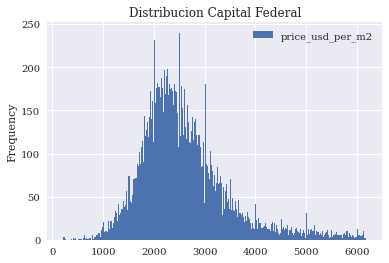

In [38]:
# frecuencias de precio usd x m2.
'''Ahora se observa una tendencia general razonable, ¿ los picos de frecuencia son razonables ?'''
df_a_geo.plot(y='price_usd_per_m2', kind= 'hist', bins=300, range=(200,6200))
plt.gca().set_title('Distribucion Capital Federal')
plt.show;

In [39]:
'''¿ Hay valores con ambientes sin reportar ?'''
df_a_geo[(df_a_geo["rooms"].isnull())]

,BARRIO,index_right,ID,property_type,place_name,country_name,state_name,lat-lon,lat,lon,...,expenses,description,title,rooms,price,surface_total_in_m2,price_usd_per_m2,price_consistent,pozo,geometry
2,CHACARITA,17157,85965,apartment,Colegiales,Argentina,Capital Federal,"-34.5816608492,-58.4515725538",-34.582,-58.452,...,3000.000,"excelente ubicacion!! con lujoso hall de entrada, ascensores de doble velocidad, cocheras fijas optativas , gimnasio, laundry, parrilla ,pileta, quincho, solarium y sum !! deptos con baños completos con paredes y pisos revestidos en porcellanato de primera calidad, mesadas de mármol. griferías y accesorios fv modelo gran gala o similar. artefactos sanitarios marca ferrum línea adriático o similar. pisos de living-comedor carpeta para parquet de eucalipto de 1º opcional, piso flotante 1º marca dormitorios alfombrados, color a elección. cocina con piso cerámico, mesada en granito, muebles de amoblamientos reno o similar, con bajo mesadas y alacenas. horno a gas línea domec o similar. sistema de agua caliente y calefacción central. bocas de teléfono y tv en todos los ambientes (cañería vacía). sistema de portero eléctrico conectado directamente al puesto de vigilancia en hall del edificio. servicios calefacción: losa radiante. por caldera central. agua caliente: central por termotanque de alta recuperación llamar para visitar !! 48990533 o whats app al 1560159598",departamento - colegiales,nan,189000.000,70.000,2700.000,True,0,POINT (-58.4515725538 -34.5816608492)
44,CHACARITA,17571,87296,apartment,Chacarita,Argentina,Capital Federal,"-34.5868808626,-58.4501071707",-34.587,-58.450,...,nan,"departamento loft amplio con balcón y baulera. posibilidad de cochera u$s 25000amenities• sum (superficie 26 m2 con balcón terraza hacia ambos frentes)• gimnasio completo (superficie 48 m2), vestuarios hombres y mujeres• sauna• solárium• laundry• terraza solárium (superficie 28 m2)• pileta adultos ( dimensiones 5m x 2.5m)• pileta niños (dimensiones 1.3m x 2.5 m)• cocheras cubiertas en subsuelo y planta baja• bauleras caracteristicas constructivas:• calefacción por piso radiante.• caldera dual. modelo a definir.• carpintería de aluminio anonizado natural aluar o similar.• grifería temple o similar.• solados madera de lapacho.• portero eléctrico con visor.• cabina de ascensor en acero inoxidable.• espacio guardado contemplado en cada unidad con escalera móvil especialmente diseñada como parte integral de la unidad.• placards / interior de placard completos / vestidores.• cocina amoblada/ bajo mesadas. sistema cerramiento panelizado de vidrio.• instalación completa para recibir la unidad de aire acondicionado, tanto exterior como interior. no se altera la composición de la fachada.• tratamiento fachada: sofisticada, chapa oxidada, hormigón y vidrio.• iluminación fachada: prevista de balcones. remarca estratos compositivos.• todas las unidades serán provistas con pisos de lapacho de primera calidad. el edificio en sí mismo y las unidades contarán con detalles de diseño propios, pensados para mejorar la calidad del mismo.- cucicba mat 475",venta dpto tipo loft grande con balcon a esternar edificio con amenities,nan,225000.000,100.000,2250.000,True,0,POINT (-58.45010717069999 -34.5868808626)
89,CHACARITA,13374,70523,apartment,Colegiales,Argentina,Capital Federal,"-34.5832125756,-58.4475600924",-34.583,-58.448,...,nan,"venta oficina espectacular edificio de diseño todo luztasaciones profesionales para sinceramiento fiscalconsultas sin compromiso - -* oficina: recepción, 3 despachos privados, salón para varios puestos de trabajo, balcón circular - 2 baños. aire acondicionados split frio - calor* edificio: moderno edificio de diseño, en esquina, muy luminoso - frente a la emblemática algodonera de palermo* barrio: en pleno desarrollo de oficinas y productoras de publicidadsi tenes que vender para comprar // somos especialistas en operaciones simultaneas// comunicate con nosotros para asesorarte.triada propiedadesjuramento 1304 

In [40]:
'''hay 965 departamentos sin especificar ambientes, los sacamos'''
df_a_geo.drop(df_a_geo[(df_a_geo["rooms"].isnull())].index,inplace=True)

In [41]:
df_a_geo.describe()

,index_right,ID,lat,lon,price_aprox_local_currency,price_aprox_usd,surface_covered_in_m2,price_per_m2,floor,expenses,rooms,price,surface_total_in_m2,price_usd_per_m2,pozo
count,13783.000,13783.000,13783.000,13783.000,13783.000,13783.000,13397.000,13396.000,2245.000,3500.000,13783.000,13783.000,13783.000,13783.000,13783.000
mean,10161.876,52685.349,-34.598,-58.431,4259050.228,241381.180,92.889,4356.947,13.361,6201.312,2.533,241120.765,113.858,2926.726,0.000
std,6571.988,32566.635,0.025,0.038,8931953.873,506217.454,1621.973,23760.907,90.276,169042.630,1.275,506257.269,2336.001,22270.720,0.000
min,0.000,2.000,-34.698,-58.531,90050.640,5103.610,0.000,3.209,1.000,1.000,0.000,4564.103,1.000,3.209,0.000
25%,5214.500,26846.000,-34.617,-58.460,1746805.500,99000.000,39.000,2203.167,2.000,1487.250,2.000,99000.000,42.000,2028.213,0.000
50%,9445.000,48799.000,-34.599,-58.432,2579925.850,146217.000,56.000,2714.286,4.000,2200.000,2.000,146000.000,61.000,2446.809,0.000
75%,14414.000,74053.000,-34.580,-58.401,4411125.000,250000.000,88.000,3409.091,7.000,3800.000,3.000,250000.000,97.000,3018.103,0.000
max,23762.000,121217.000,-34.535,-58.355,821271104.300,46545445.000,187000.000,2600000.000,2509.000,10001500.000,22.000,46545445.000,200000.000,2600000.000,0.000


In [42]:
'''Veamos la cantidad de departamentos superiores a los 600 m2'''
df_a_geo[(df_a_geo["surface_total_in_m2"]>600)].sort_values('surface_total_in_m2')

,BARRIO,index_right,ID,property_type,place_name,country_name,state_name,lat-lon,lat,lon,...,expenses,description,title,rooms,price,surface_total_in_m2,price_usd_per_m2,price_consistent,pozo,geometry
12589,RECOLETA,4002,24159,apartment,Recoleta,Argentina,Capital Federal,"-34.5862589,-58.3977093",-34.586,-58.398,...,nan,"espectacular triplex, super exclusivo, en la mejor zona de buenos aires, la isla.el departamento es el penthouse del edificio y cuenta con una ubicación especial dentro de la isla, ya que al estar ubicado en la manzana que se ingresa por copérnico y da por el contrafrente a av las heras, o sea que tiene frente mirando al río y frente mirando a la ciudad.en un edificio de categoría que tiene seguridad las 24 hs, salón de fiestas y gimnasio.en el piso 10 se encuentra el palier privado, un hall, pisos de mármol, living con chimenea, un amplio comedor, family room de 60 m2, dos oficinas, la cocina con un gran comedor diario y dos toilettes. con un balcón aterrazado sobre copernico y un balcón cerrado sobre av. las heras.el departamento cuenta con un ascensor de uso exclusivo que va desde el piso 10 al piso 12 .en el piso 11 se encuentran tres dormitorios en suite, dos de los cuales se comunican por un playroom. sobre copérnico se encuentra la terraza con una piscina climatizada de 2,5 metros x 4 metros. un quincho con parrilla y un area de fitness con sauna, ducha escocesa y vestuario. también se encuentra la dependencia de servicio con su baño.en el piso 12 se encuentra la master suite con vestidor y un lujoso baño con mesada de marmol de carrara, jacuzzi y ducha. con vista sobre av las heras y una salida a un balcón aterrazado. aqui también se encuentran el lavadero y la sala de máquinas.en el piso 13 (un cuarto piso propio) hay una terraza de uso exclusivo que sirve de solarium y tiene un aro de basquet.todas las terminaciones son de primera categoría.en todos los pisos hay aire acondicionado central frío/calor con bocas de salida individuales en cada ambiente.cuenta con tres cocheras de fácil acceso por av las heras.incluye una baulera.",triplex con pileta propia en la isla,10.000,2025000.000,604.000,3352.649,True,0,POINT (-58.3977093 -34.5862589)
12292,BELGRANO,10760,55316,apartment,Belgrano,Argentina,Capital Federal,"-34.5654417557,-58.4481677042",-34.565,-58.448,...,nan,"contacto: ana 11-excelente piso alto en dúplex de 7 ambientes, de 610 m2 totales de los cuales 500 m2 son cubiertos, con amenities y 2 cocheras fijas en edificio de 15 años de antigüedad reciclado, ubicado en la mejor zona de belgrano, presenta en el nivel inferior: palier privado, hall recibidor con toilette y placard de recepción, lc apaisado de 20 mtrs. lineales, chimenea y salida a balcón corrido aterrazado, con visuales a verde, comedor de generosas medidas, escritorio, 3 dormitorios en suite, con gran profusión de placards, 1 de ellos es master suite con importante vestidor, cocina con comedor diario, lavadero independiente con sala de planchado, dependencia de servicio, en el nivel superior: comprende 2 dormitorios en semi-suite, amplio playroom, cocina, parrilla propia con salida a terraza de 80 m2. todas las persianas de madera tipo barrio automatizadas , en el nivel inferior se accede desde palier privado o por entrada de servicio. calefacción central por losa radiante, aa por split en todos lo ambientes, posee 2 cocheras fijas cubiertas y 2 bauleras. vigilancia las 24 hs. en cuanto a los amenities cuenta con piscina climatizada, gym, sum, grupo electrógeno y cocheras de cortesía",v.loreto y arcos-piso dúplex 7 amb. 610 m2+2 coch+amenities - belgrano,7.000,1500000.000,610.000,2459.016,True,0,POINT (-58.4481677042 -34.5654417557)
6635,BALVANERA,6569,34696,apartment,Balvanera,Argentina,Capital Federal,"-34.610835,-58.411324",-34.611,-58.411,...,nan,corredor responsable: luis roman garcia - c.u.c.i.c.b.a 4040contacto: jorge stein - mls id # 420111090-60- hotel de pasajeros en zona de gran movimiento. - ubicado en el primer piso. - 20 h

In [43]:
'''Cuales son propiedades que salen de lo normal, exploremos los outliers'''
df_a_geo[(df_a_geo["price_usd_per_m2"]>5000) | (df_a_geo["price_usd_per_m2"]<300)].sort_values('price_usd_per_m2')

,BARRIO,index_right,ID,property_type,place_name,country_name,state_name,lat-lon,lat,lon,...,expenses,description,title,rooms,price,surface_total_in_m2,price_usd_per_m2,price_consistent,pozo,geometry
13861,RECOLETA,15037,76012,apartment,Barrio Norte,Argentina,Capital Federal,"-34.5945726028,-58.409166395",-34.595,-58.409,...,11000.000,"barrio norte excelente semipiso al frente balcón corrido superficie 187 metros todos los ambientes muy luminosos y soleados - palier privado. 4 dormitorios - c/dependencia servicio - 4 bañosrecepción y comedor,cocina con comedor diario y lavadero cochera fija y gran baulera sercios centrales edificio con entrada de cortesía expensas incluye aysa y vigilancia $11.000.-",excelente piso en barrio norte,4.000,600000.000,187000.000,3.209,True,0,POINT (-58.409166395 -34.5945726028)
2740,MONTE CASTRO,11076,56484,apartment,Monte Castro,Argentina,Capital Federal,"-34.618411,-58.497949",-34.618,-58.498,...,nan,"corredor responsable: uno bienes raices srl - cucicba 4993 contacto: alberto farías - mls id # 420951004-1ecelente departamento, 4 ambientes amplios, muy luminoso y aireado, con balcón en muy buen estado. apto crédito",excelente depto de 4 ambienes muy luminoso,4.000,138000.000,9152.000,15.079,True,0,POINT (-58.497949 -34.618411)
3649,FLORESTA,21141,109722,apartment,Floresta,Argentina,Capital Federal,"-34.6317378902,-58.4794281617",-34.632,-58.479,...,nan,"corredor responsable: hernan perrone - c.u.c.i.c.b.a 2792contacto: claudia collini - mls id # 151096-123departamento 4 ambientes, living comedor con balcon, cocina comedor diario con lavadavero, baño completo, 3 dormitorios con placard. muy ventido y mucha luz. muchos medios de transporte, a 1 cuadra de rivadavia,. estación de ffcc estacíon floresta. bajas expensas.",departamento 4 ambientes cocina separada mucha luz,4.000,108000.000,6534.000,16.529,True,0,POINT (-58.4794281617 -34.6317378902)
6586,BALVANERA,22748,117183,apartment,Congreso,Argentina,Capital Federal,"-34.609821,-58.392606",-34.610,-58.393,...,nan,"corredor responsable: flavia aguirre - c.u.c.i.c.b.a 471contacto: silvia alvarez - mls id # 81127-18departamento 2 ambientes. living/ comedor, un dormitorio, cocina independiente con lavadero integrado. baño completo, expensas $2.100 muy bien ubicado en la zona de congreso, a solo 4 cuadras de estación saenz peña de subte a y a cuatro cuadras de congreso de la nación y proximidad a medios de transportes proporcionando acceso a distintos puntos de la ciudad. a tan solo media cuadra del instituto favaloro. no apto credito.",congreso. 2 ambientes. excelente ubicacion !!,2.000,72000.000,3896.000,18.480,True,0,POINT (-58.39260600000001 -34.609821)
1427,ALMAGRO,8659,45122,apartment,Almagro,Argentina,Capital Federal,"-34.613534,-58.416212",-34.614,-58.416,...,nan,"corredor responsable: jorge salafia - cucicba 5666contacto: andrea butty - mls id # 420211115-47departamento de 2 ambientes recien pintado, lateral luminoso - living comedor con pisos de parquet y detalle de luz difusa en el techo; dormitorio luminoso con placard y pequeño espacio de guardado (guardilla/vestidor), baño y cocina en buen estado, de epoca.. expensas mayo $ 1250 - hipolito irigoyen esquina maza proximo a medios de transporte y zona comercial. es apto credito martillero responsable jorge salafia cucicba 5666 .",venta departamento 2 amb. apto credito - almagro-,2.000,70000.000,3330.000,21.021,True,0,POINT (-58.416212 -34.613534)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2690,VILLA SANTA RITA,10479,53562,apartment,Villa del Parque,Argentina,Capital Federal,"-34.609738,-58.481149",-34.610,-58.481,...,nan,"edificio de 9 pisos - semipisos balcon de 2,95 x 1,25 living comedor de 4,50 x 3,60 cocina comedor de 4,45 x 1,50 dormitorio de 3,40 x 3 baño completo valor desde u$s 99.000 opción cocheras financiacion //las medidas indicadas son aproximadas y al solo efecto orientativo. las reales surgirán del titulo de propiedad respectivo.",te

In [44]:
df_a_geo.to_csv("apartments_clean_outliers.csv")

In [45]:
'''HeatMap en Folium'''

'HeatMap en Folium'

In [46]:
import geopandas
import fiona
import rtree
import pandas as pd
import numpy as np
import datetime
from os import listdir
from pylab import plt
plt.style.use('seaborn')
import matplotlib as mpl
mpl.rcParams['font.family'] = 'serif'
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('display.max_colwidth', -1)
barrios = pd.read_csv("barrios.csv", encoding='latin1')
df_a_geo_clean = pd.read_csv("apartments_clean_outliers.csv", encoding="utf-8")

C:\Users\Alfredo\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  from ipykernel import kernelapp as app


In [47]:
def from_wkt(df, wkt_column):
    import shapely.wkt
    df["coordinates"]= df[wkt_column].apply(shapely.wkt.loads)
    gdf = geopandas.GeoDataFrame(barrios, geometry='coordinates')
    return gdf

In [48]:
barrios = from_wkt(barrios, "WKT")

In [49]:
from shapely.geometry import Point
barrios.crs = {'init' :'epsg:4326'}

C:\Users\Alfredo\Anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [50]:
def from_x_y(df, x, y):
    gdf = geopandas.GeoDataFrame(df,
                                crs={'init': 'epsg:4326'},
                                geometry=[Point(xy) for xy in zip(df[x], df[y])])
    return gdf

In [51]:
df_heat=from_x_y(df_a_geo_clean,"lon","lat")

In [52]:
import folium
from folium.plugins import HeatMap

In [53]:
df_heat_comuna=df_heat[(df_heat["BARRIO"]=="RETIRO") | (df_heat["BARRIO"]=="PUERTO MADERO") |
                       (df_heat["BARRIO"]=="CONSTITUCION") | (df_heat["BARRIO"]=="MONSERRAT") |
                       (df_heat["BARRIO"]=="SAN TELMO") | (df_heat["BARRIO"]=="SAN NICOLAS")][["lat","lon","price_usd_per_m2"]]

In [54]:
heat_data_comuna = [[row['lat'],row['lon'],row["price_usd_per_m2"]] for index, row in df_heat_comuna.iterrows()]

In [55]:
#Veamos una imagen general de la distribucion de precios por m2
m = folium.Map([-34.606359, -58.371863], zoom_start=14, tiles="OpenStreetMap")
folium.GeoJson(barrios[(barrios["COMUNA"]==1)].to_json()).add_to(m)
HeatMap(heat_data_comuna, min_opacity=0.3,max_val=max(df_heat_comuna["price_usd_per_m2"]),radius=16, blur=15, max_zoom=1).add_to(m)
m